<h1>Semantic Similarity</h1>

In [1]:
import pandas as pd
import numpy as np
from datasets import load_dataset

In [1]:
pip show datasets

Name: datasets
Version: 2.18.0
Summary: HuggingFace community-driven open-source library of datasets
Home-page: https://github.com/huggingface/datasets
Author: HuggingFace Inc.
Author-email: thomas@huggingface.co
License: Apache 2.0
Location: C:\Users\Satvik Jain\AppData\Roaming\Python\Python311\site-packages
Requires: aiohttp, dill, filelock, fsspec, huggingface-hub, multiprocess, numpy, packaging, pandas, pyarrow, pyarrow-hotfix, pyyaml, requests, tqdm, xxhash
Required-by: evaluate
Note: you may need to restart the kernel to use updated packages.


In [2]:
ds = load_dataset("big_patent","d")

C:\Users\Satvik Jain\AppData\Roaming\Python\Python311\site-packages\datasets\load.py:1461: FutureWarning: The repository for big_patent contains custom code which must be executed to correctly load the dataset. You can inspect the repository content at https://hf.co/datasets/big_patent
You can avoid this message in future by passing the argument `trust_remote_code=True`.
Passing `trust_remote_code=True` will be mandatory to load this dataset from the next major release of `datasets`.
  warnings.warn(


In [3]:
ds['train'].shape
data = pd.DataFrame(ds['train'][:2000])
data.head()

,description,abstract
0,BACKGROUND OF THE INVENTION \n This invent...,A method of forming fiber mixtures from differ...
1,CROSS-REFERENCE TO RELATED APPLICATION \n ...,The fibers of recycled paper are cleaned by ag...
2,This is a division of application Ser. No. 922...,"Non-woven, bias laid fabrics, where the variou..."
3,FIELD OF THE INVENTION \n The present inve...,Multiple-color air jet looms successively inse...
4,[0001] This application claims the benefit...,A method of performing a spinning operation of...


In [17]:
patent_summaries= data["abstract"]
patent_summaries
patent_titles=[]
for i in range(1,2000):
    patent_titles.append("Patent"+str(i))
patent_titles

['Patent1',
 'Patent2',
 'Patent3',
 'Patent4',
 'Patent5',
 'Patent6',
 'Patent7',
 'Patent8',
 'Patent9',
 'Patent10',
 'Patent11',
 'Patent12',
 'Patent13',
 'Patent14',
 'Patent15',
 'Patent16',
 'Patent17',
 'Patent18',
 'Patent19',
 'Patent20',
 'Patent21',
 'Patent22',
 'Patent23',
 'Patent24',
 'Patent25',
 'Patent26',
 'Patent27',
 'Patent28',
 'Patent29',
 'Patent30',
 'Patent31',
 'Patent32',
 'Patent33',
 'Patent34',
 'Patent35',
 'Patent36',
 'Patent37',
 'Patent38',
 'Patent39',
 'Patent40',
 'Patent41',
 'Patent42',
 'Patent43',
 'Patent44',
 'Patent45',
 'Patent46',
 'Patent47',
 'Patent48',
 'Patent49',
 'Patent50',
 'Patent51',
 'Patent52',
 'Patent53',
 'Patent54',
 'Patent55',
 'Patent56',
 'Patent57',
 'Patent58',
 'Patent59',
 'Patent60',
 'Patent61',
 'Patent62',
 'Patent63',
 'Patent64',
 'Patent65',
 'Patent66',
 'Patent67',
 'Patent68',
 'Patent69',
 'Patent70',
 'Patent71',
 'Patent72',
 'Patent73',
 'Patent74',
 'Patent75',
 'Patent76',
 'Patent77',
 'Patent

In [6]:
%pip install -U sentence-transformers

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



**Generate Embeding**

In [18]:
from sentence_transformers import SentenceTransformer,util
model = SentenceTransformer('all-MiniLM-L6-v2')

In [19]:
embeddings = model.encode(patent_summaries)


for summary, embedding in zip(patent_summaries, embeddings):
    print("Summary:", summary)
    print("Embedding:", embedding)
    print("")

Summary: A method of forming fiber mixtures from different kinds of fiber includes the step of removing the fiber in a plurality of passes from a plurality of stored fiber lots containing the different kinds of fiber. During each pass, fiber is removed from consecutive stored fiber lots in partial quantities that are small relative to the entire fiber quantities in the stored fiber lots. According to the method, prior to fiber removal in the first pass, the entire fiber quantity in each stored fiber lot is separately determined and from such entire fiber quantity there is determined, for each stored fiber lot, a partial quantity to be removed from each stored fiber lot during the first pass. Each partial quantity represents a proportion of the entire fiber quantity of the respective stored fiber lot. Thereafter, at least during the first pass, the determined partial quantity is removed from the respective stored fiber lot.
Embedding: [ 3.24069858e-02 -1.08199343e-02  6.68526590e-02  5.

In [57]:
# new1={"1. An advanced materials handling system for construction sites features autonomous robotic loaders and drones that work in unison to transport materials across the site. Equipped with GPS and AI-based navigation systems, these robots efficiently manage logistics, reducing labor costs and improving safety. The system includes real-time monitoring through a centralized dashboard that tracks material movement, inventory levels, and predicts future logistics needs, optimizing the supply chain and minimizing delays in the construction process.",
# "A next-generation biomass conversion system designed for renewable energy plants utilizes pyrolysis technology to convert agricultural waste into biochar and syngas. The system features an energy-efficient design that maximizes output while minimizing emissions. Advanced sensors monitor the process, adjusting operational parameters in real time to optimize efficiency and ensure consistent product quality. This not only helps in reducing agricultural waste but also provides a sustainable source of energy and soil enhancer.",
# "An automated textile dyeing system integrates nanofiltration technology to recycle dye bath water, significantly reducing water and dye consumption. The system uses precision dosing pumps and advanced color sensors to ensure consistent color application and quality. Coupled with a real-time analytics platform, it provides actionable insights into process efficiency, dye usage, and waste reduction, leading to substantial cost savings and environmental benefits.",
# "A high-precision glass cutting machine for the manufacturing of smartphone screens employs laser technology for cutting with extreme accuracy. The system includes an adaptive control software that adjusts parameters for different glass thicknesses and compositions. Enhanced with machine vision for defect detection, it ensures high yield rates and minimal waste, critical for high-end electronics manufacturing.",
# "A sophisticated environmental monitoring system for chemical plants uses IoT sensors distributed throughout the facility to detect and analyze emissions of volatile organic compounds. The system employs advanced algorithms to predict potential emission spikes and automatically adjusts production processes to mitigate risks. This proactive approach not only ensures compliance with environmental regulations but also improves community health and safety.",
# "A state-of-the-art grain storage facility incorporates an intelligent aeration system that dynamically adjusts temperature and humidity levels based on real-time grain condition data. This system uses machine learning to predict spoilage risks and optimize storage conditions, significantly extending grain viability and quality. The integration with a blockchain-based tracking system ensures full traceability from farm to table.",
# "An innovative marine propulsion system combines hybrid diesel-electric engines with solar panels and energy storage systems to provide efficient and sustainable power for cargo ships. This system reduces fuel consumption and emissions significantly, with the flexibility to switch between power sources based on availability and cost. Real-time data analytics optimize route and speed, further enhancing fuel efficiency and reducing operational costs.",
# "A comprehensive waste sorting and recycling facility uses robotic arms equipped with AI to identify and sort different types of waste materials. These robots are supported by a sophisticated vision system that can recognize various materials, even when they are dirty or partially obscured. The facility processes large volumes of waste efficiently, extracting valuable materials for reuse and significantly reducing landfill dependency.",
# "A digital imaging system for the inspection of underground pipelines uses autonomous robots that navigate through pipelines, capturing high-resolution images. These images are then analyzed using AI to detect cracks, leaks, and other anomalies. This system allows for early detection of potential issues, preventing costly repairs and environmental damage, and ensuring pipeline integrity and safety.",
# "An advanced aircraft engine testing facility features a virtual simulation environment that replicates extreme flying conditions to test engine performance and durability. Sensors embedded in the engines collect data on various parameters, which are analyzed using high-performance computing systems to predict engine behavior and identify potential failures before they occur. This approach reduces testing time and costs while improving engine safety and reliability."}
# nset.update(new1)
# len(nset)

50

In [21]:
import pandas as pd

df= pd.read_csv('precisionScores.csv')

nset= df['Patent']
nset[0]

"A plating feeder in a circular knitting machine offers a mechanism for feeding two yarns through distinct mouths, which can be adjusted to change the yarns' feeding angle during knitting. The system includes a spring urging the mouths together, with a cam and follower setup to adjust the yarn mouths' relative positions, enhancing yarn feeding flexibility."

**Cosine-Similarity**

In [8]:
# # Compute cosine similarity between all pairs
# newPatent="The current innovation introduces a filament featuring a readily detachable protective layer, along with a technique and device for applying this layer during the filament drawing process. This coating can be effortlessly eliminated using mild solvents such as water, or if required, acetone or ethanol. It is water-soluble and can be conveniently dissolved inline with the spooling process. The coating material may incorporate a water-soluble substance with a texture akin to wax, named Aquabond 65, distributed by Aquabond Technologies. Additionally, other variations of Aquabond, such as Aquabond 55 and Aquabond 85, exhibit similar properties but dissolve at varying temperatures."


# # #Encode newPatent
# inpEmb = model.encode(newPatent)

# # #Compute cosine similarity between all pairs
# cos_sim = util.cos_sim(inpEmb, embeddings)

# # cos_sim[0][1]



In [23]:
import csv
header=[['Patent','Summaries','Precision']]
filename='precisionScores.csv'
with open(filename, 'w',newline='') as csvfile:
        csvwriter=csv.writer(csvfile)
        csvwriter.writerows(header)
num=0;
for i in nset:
    #Encode newPatent
    newPatent=i
    inpEmb = model.encode(newPatent)

    #Compute cosine similarity between all pairs
    cos_sim = util.cos_sim(inpEmb, embeddings)
    #Add all pairs to a list with their cosine similarity score
    all_combos = []
    for j in range(0,len(cos_sim[0])-1):
        all_combos.append((cos_sim[0][j],patent_titles[j]))
    # all_combos      

    #Sort list by the highest cosine similarity score
    all_combos = sorted(all_combos, key=lambda x: x[0], reverse=True) 
    topList= all_combos[0:5]
    print(topList)

    if(num<30):
        precision=(topList[0][0]+topList[1][0]+topList[2][0]+topList[3][0])/4
        print("{:.3f}".format(precision))
        summs=[]
        for k,l in topList:
            summs.append(patent_summaries[int(l[6:])-1])
        # print(len(summs))
        p_data=[[newPatent,summs,precision]]
        # print(data)

        with open(filename, 'a',newline='') as csvfile:
            csvwriter=csv.writer(csvfile)
            csvwriter.writerows(p_data)
    else:
        precision=(topList[0][0]+topList[1][0]+topList[3][0])/3
        print("{:.3f}".format(precision))
        summs=[]
        for j,l in topList:
            summs.append(patent_summaries[int(l[6:])-1])
        # print(len(summs))
        p_data=[[newPatent,summs,precision]]
        # print(data)

        with open(filename, 'a',newline='') as csvfile:
            csvwriter=csv.writer(csvfile)
            csvwriter.writerows(p_data)
    num+=1
    
      


[(tensor(0.9026), 'Patent1182'), (tensor(0.7402), 'Patent1559'), (tensor(0.6693), 'Patent1864'), (tensor(0.6484), 'Patent1810'), (tensor(0.6439), 'Patent604')]
0.740
[(tensor(0.3275), 'Patent1716'), (tensor(0.2992), 'Patent909'), (tensor(0.2429), 'Patent1166'), (tensor(0.2285), 'Patent407'), (tensor(0.2284), 'Patent7')]
0.275
[(tensor(0.4338), 'Patent479'), (tensor(0.3888), 'Patent1074'), (tensor(0.3740), 'Patent1617'), (tensor(0.3576), 'Patent1660'), (tensor(0.3557), 'Patent1014')]
0.389
[(tensor(0.2417), 'Patent540'), (tensor(0.2394), 'Patent994'), (tensor(0.2379), 'Patent648'), (tensor(0.2318), 'Patent1154'), (tensor(0.2291), 'Patent46')]
0.238
[(tensor(0.4883), 'Patent681'), (tensor(0.4774), 'Patent429'), (tensor(0.4549), 'Patent249'), (tensor(0.4498), 'Patent1166'), (tensor(0.4476), 'Patent850')]
0.468
[(tensor(0.7719), 'Patent484'), (tensor(0.6590), 'Patent1194'), (tensor(0.6377), 'Patent219'), (tensor(0.5416), 'Patent850'), (tensor(0.5375), 'Patent389')]
0.653
[(tensor(0.6367), 

In [ ]:
# #Add all pairs to a list with their cosine similarity score
# all_combos = []
# for i in range(0,len(cos_sim[0])-1):
#     all_combos.append((cos_sim[0][i],patent_titles[i]))
# all_combos      


In [ ]:
#Sort list by the highest cosine similarity score
# all_combos = sorted(all_combos, key=lambda x: x[0], reverse=True)

# print("Top-5 most similar pairs:")
# topList= all_combos[0:5]
# for score, i in topList:
#     # print(newPatent+"\n", i+"\n", score)
#     print("{}\n {}\n {:.3f}".format(newPatent, patent_summaries[int(i[6:])-1], score*100))


In [23]:
# precision=(topList[0][0]+topList[2][0]+topList[4][0])/3
# print("{:.3f}".format(precision))



1.497


In [27]:
# import csv
# summs=[]
# for j,i in topList:
#     summs.append(patent_summaries[int(i[6:])-1])
# # print(len(summs))
# p_data=[['Patent','Summaries','Precision'],[newPatent,summs,precision]]
# # print(data)
# filename='precisionScores.csv'

# with open(filename, 'w',newline='') as csvfile:
#     csvwriter=csv.writer(csvfile)
#     csvwriter.writerows(p_data)

50
['P 1', 'P 2', 'P 3', 'P 4', 'P 5', 'P 6', 'P 7', 'P 8', 'P 9', 'P 10', 'P 11', 'P 12', 'P 13', 'P 14', 'P 15', 'P 16', 'P 17', 'P 18', 'P 19', 'P 20', 'P 21', 'P 22', 'P 23', 'P 24', 'P 25', 'P 26', 'P 27', 'P 28', 'P 29', 'P 30', 'P 31', 'P 32', 'P 33', 'P 34', 'P 35', 'P 36', 'P 37', 'P 38', 'P 39', 'P 40', 'P 41', 'P 42', 'P 43', 'P 44', 'P 45', 'P 46', 'P 47', 'P 48', 'P 49', 'P 50']
[0.7401, 0.2745, 0.3886, 0.2377, 0.4676, 0.6526, 0.625, 0.7714, 0.5719, 0.3335, 0.3719, 0.3209, 0.4169, 0.4338, 0.4412, 0.4299, 0.4174, 0.5213, 0.4847, 0.3801, 0.3713, 0.5714, 0.3933, 0.3946, 0.4887, 0.6113, 0.6303, 0.4761, 0.3556, 0.4746, 0.6783, 0.3911, 0.3746, 0.5467, 0.487, 0.3116, 0.3545, 0.7995, 0.4926, 0.5676, 0.3059, 0.473, 0.7578, 0.5193, 0.4055, 0.5472, 0.3926, 0.3253, 0.7007, 0.3967]


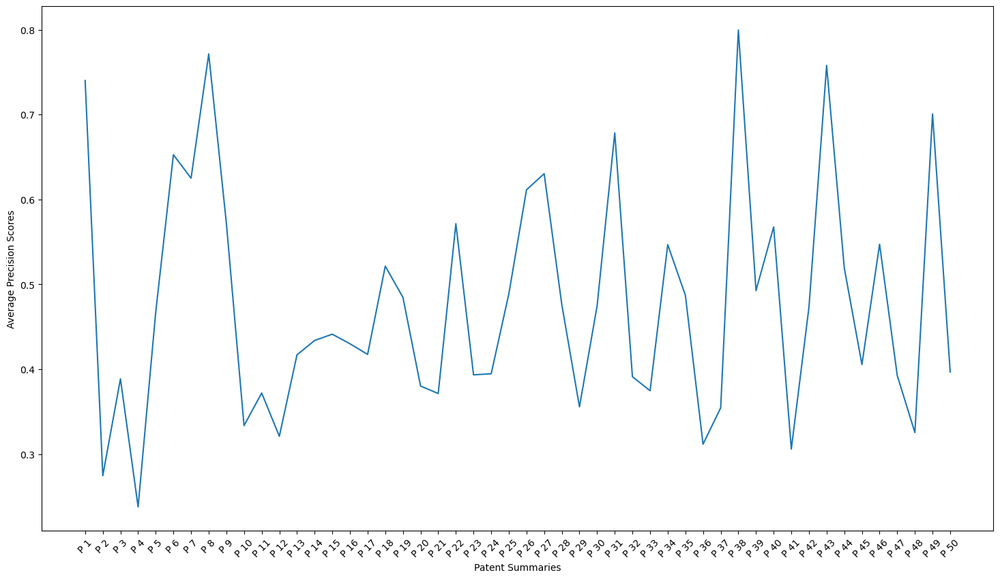

In [25]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"]=(18,10)
import pandas as pd

df= pd.read_csv('precisionScores.csv')
print(len(df))
# x_values=[1,2,3,4]
# y_values=[10,20,30,40]

y_values=df['Precision']
float_values = [float(value.split('(')[1].split(')')[0]) for value in y_values]
x_values=[]
for i in range (1,51):
    x_values.append("P "+str(i))
print(x_values)
print(float_values)

plt.plot(x_values,float_values)
plt.xlabel('Patent Summaries')
plt.ylabel('Average Precision Scores')
plt.xticks(x_values,rotation=45)
plt.show()